In [9]:
# all the imports
import pandas as pd
import matplotlib.pyplot as plt

import os
import glob

import numpy as np
from ipynb.fs.full.AppProcessing import *

In [ ]:
# def tidyAppOutput(file, sec = False):
#     """
#     Tidies the App Output to better plot in the next steps. Removes meta data and sets the timestaps as index.
#     Timestamp is in msec, if not desired it can be changed to seconds here. But this results in slightly 
#     different visualization in the next steps 
#     --------------------
#     Parameter:
#         file: A pandas dataframe created from in the original app format
#         sec (boolean): If true mesec are transformed into seconds
        
#         Returns:
#         file: cleaned up dataframe
        
#     """
#     file = file.iloc[1:]
#     file.columns = file.iloc[0]
#     file = file[1:].apply(pd.to_numeric, errors='ignore')
#     # to set index to seconds and not miliseconds
#     if sec:
#         sec_index = file.index[:].tolist()
#         sec_index = [float(i) for i in sec_index]
#         sec_index[:] = [x / 1000 for x in sec_index] #converts 
#         file.index = sec_index
    
#     return file

# def plot_trace(df, channelname, fro = 0, to = 400, sec=False, title = "Experiment", save = False, saveas = "Experiment"):
#     """
#     Plots the trace from individual Traumschreiber channels. 
#     --------------
#     Parameter:
#     df: a cleaned up dataframe containing the app output
#     channelname (array with string): the channelname to be displayed (["Ch-1"],["Ch-2"],["Ch-3"],["Ch-4"],["Ch-5"],["Ch-6"]) 
#     fro (int): starting point to plot the trace. The fro_th datapoint is plotted
#     to (int): The to_th datapoint is the end of the plot
#     sec (boolean): If index is in seconds (specified in tidyTSAppOutput), the axis label is changed 
#     title: Title of the plot
#     save (boolean): True if plot shall be saved (in working directory) as png
#     saveas (string): Name of the saved file
#     """
#     df = df.iloc[fro:to]
    
#     ax = df.plot(y = channelname, grid = True, title = title, figsize=(15,10), subplots = True)
#     if sec:
#        ax.set_xlabel("s") 
#     else:
#        ax.set_xlabel("msec")
#     ax.set_ylabel("mVolt") # verify the correct unit    
#     if save:    
#         plt.savefig(saveas+'.png') # saves as .png at the moment as was better for displaying/discussing in slack

In [11]:
# To Do: CLean this up. But not today

path = os.getcwd()
extension = 'csv'
os.chdir(path)
all_csv = glob.glob('*.{}'.format(extension))
print(all_csv)

df_1 = tidyAppOutput(pd.read_csv("24_1.csv"))
df_2 = tidyAppOutput(pd.read_csv("24_2.csv"))
print(df_1)
#plotTraceApp(df_1)
#plot_trace(df_2, ["Ch-1","Ch-2","Ch-3","Ch-4","Ch-5","Ch-6"], save= True, saveas = "df_1")

['24-08-2020_12-23-32_exp1.csv', '24-08-2020_12-34-13_exp2 .csv', '24-08-2020_12-35-12_exp3.csv', '24-08-2020_12-38-40_exp4.csv', '24-08-2020_12-39-08_exp5 .csv', '24-08-2020_12-39-32_exp6.csv', '24-08-2020_12-40-47_exp7.csv', '24-08-2020_12-41-41_exp8.csv', '24-08-2020_12-44-26_exp9.csv', '24-08-2020_12-44-56_exp10.csv', '24-08-2020_12-45-14_exp11.csv', '24-08-2020_12-45-43_exp12.csv', '24-08-2020_12-46-43_exp13.csv', '24-08-2020_12-47-26_exp14.csv', '24-08-2020_12-47-47_exp15.csv', '24-08-2020_12-48-10_exp16.csv', '24-08-2020_12-48-39_exp17.csv', '24-08-2020_12-48-59_exp18.csv', '24-08-2020_12-50-55_exp19.csv', '24-08-2020_12-51-32_exp20.csv', '24-08-2020_12-51-57_exp21.csv', '24-08-2020_12-53-13_exp22.csv', '24-08-2020_12-53-29_exp23.csv', '24-08-2020_12-53-51_exp24.csv', '24-08-2020_13-02-03_exp25.csv', '24-08-2020_13-02-48_exp26.csv', '24-08-2020_13-03-31_exp27.csv', '24-08-2020_13-04-15_exp28.csv', '24-08-2020_13-05-51_exp29.csv', '24-08-2020_13-06-33_exp30.csv', '24-08-2020_13-1

C:\Users\lkrie\Anaconda3\lib\site-packages\pandas\plotting\_tools.py:307: MatplotlibDeprecationWarning: 
The rowNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().rowspan.start instead.
  layout[ax.rowNum, ax.colNum] = ax.get_visible()
C:\Users\lkrie\Anaconda3\lib\site-packages\pandas\plotting\_tools.py:307: MatplotlibDeprecationWarning: 
The colNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().colspan.start instead.
  layout[ax.rowNum, ax.colNum] = ax.get_visible()
C:\Users\lkrie\Anaconda3\lib\site-packages\pandas\plotting\_tools.py:313: MatplotlibDeprecationWarning: 
The rowNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().rowspan.start instead.
  if not layout[ax.rowNum + 1, ax.colNum]:
C:\Users\lkrie\Anaconda3\lib\site-packages\pandas\plotting\_tools.py:313: MatplotlibDeprecationWar

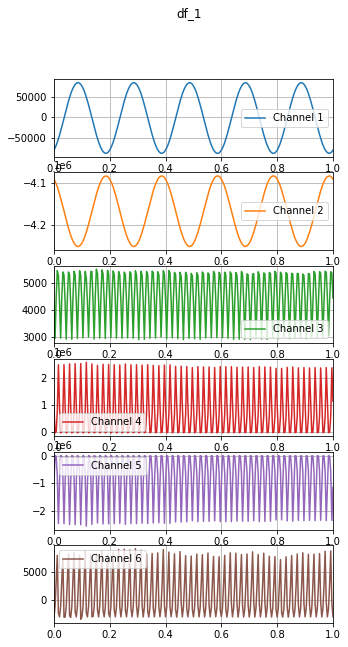

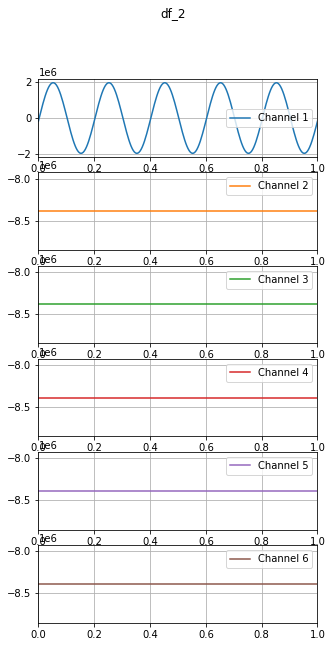

In [29]:
def read_clean_nRF(file, start_with_0 = False):
    df = pd.read_csv(file)
    df.drop(labels = "time", axis = "columns", inplace = True, errors= 'ignore')
    if start_with_0:
        df.rename(columns={'Unnamed: 1':'Channel 0', 'Unnamed: 2':'Channel 1', 'Unnamed: 3':'Channel 2', 'Unnamed: 4':'Channel 3', 'Unnamed: 5':'Channel 4', 'Unnamed: 6':'Channel 5'}, inplace=True )
    else:
        df.rename(columns={'Unnamed: 1':'Channel 1', 'Unnamed: 2':'Channel 2', 'Unnamed: 3':'Channel 3', 'Unnamed: 4':'Channel 4', 'Unnamed: 5':'Channel 5', 'Unnamed: 6':'Channel 6'}, inplace=True )
    
    return df

def visualize_nRF(file, start_with_0 = False, save=False, title ="non"):
    #saveas = str(file)+".pdf"
    #print(df)
    df = file.loc[0.000:1.004]
    if start_with_0:
        df.plot(y=["Channel 0", "Channel 1", "Channel 2" , "Channel 3" , "Channel 4" , "Channel 5"], grid=True , sharex = False, figsize=(5,10), subplots=True, title= title, layout=(6,1))
    else:
        df.plot(y=["Channel 1", "Channel 2" , "Channel 3" , "Channel 4" , "Channel 5", "Channel 6" ], grid=True , sharex = False, figsize=(5,10), subplots=True, title= title, layout=(6,1))
    if save:
        plt.savefig(str(title)+".png")
        
visualize_nRF(read_clean_nRF("24_1.csv", start_with_0 = False), save= True, title = "df_1", start_with_0 = False)
visualize_nRF(read_clean_nRF("24_2.csv", start_with_0 = False), save= True, title = "df_2", start_with_0 = False)

C:\Users\lkrie\Anaconda3\lib\site-packages\pandas\plotting\_tools.py:307: MatplotlibDeprecationWarning: 
The rowNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().rowspan.start instead.
  layout[ax.rowNum, ax.colNum] = ax.get_visible()
C:\Users\lkrie\Anaconda3\lib\site-packages\pandas\plotting\_tools.py:307: MatplotlibDeprecationWarning: 
The colNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().colspan.start instead.
  layout[ax.rowNum, ax.colNum] = ax.get_visible()
C:\Users\lkrie\Anaconda3\lib\site-packages\pandas\plotting\_tools.py:313: MatplotlibDeprecationWarning: 
The rowNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().rowspan.start instead.
  if not layout[ax.rowNum + 1, ax.colNum]:
C:\Users\lkrie\Anaconda3\lib\site-packages\pandas\plotting\_tools.py:313: MatplotlibDeprecationWar

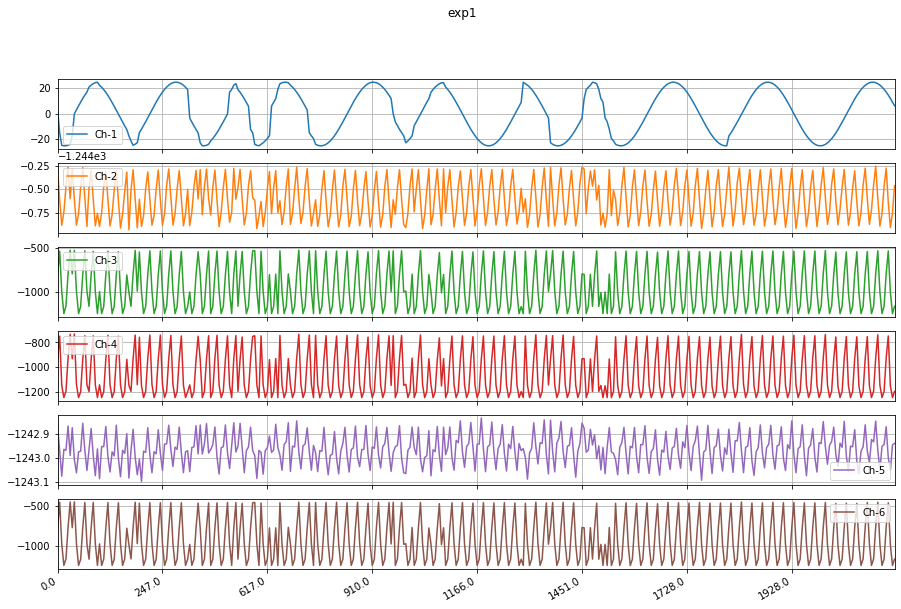

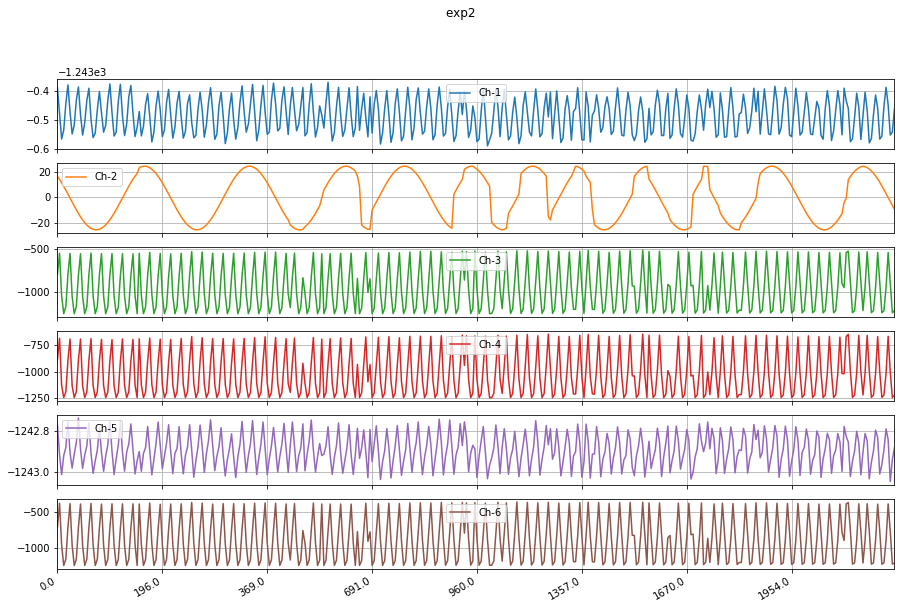

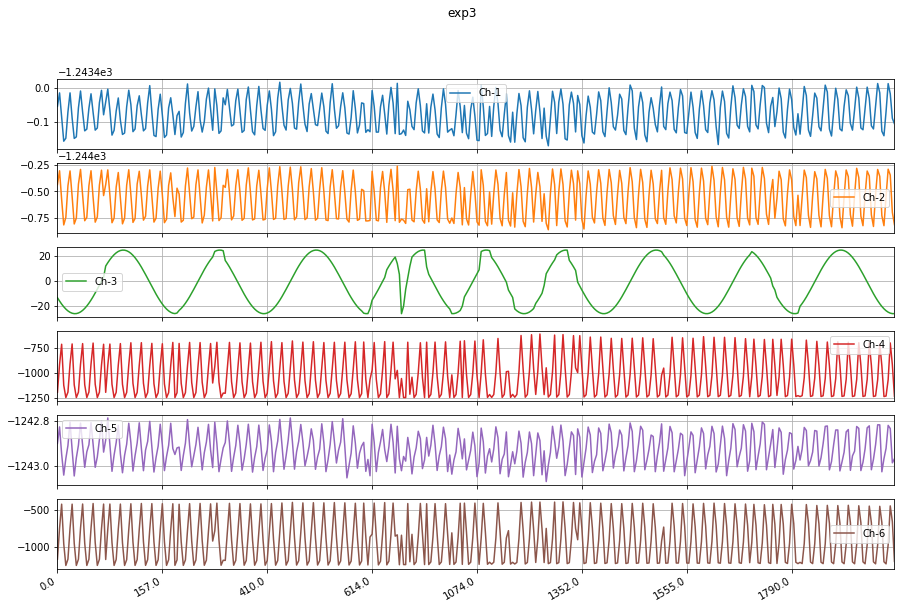

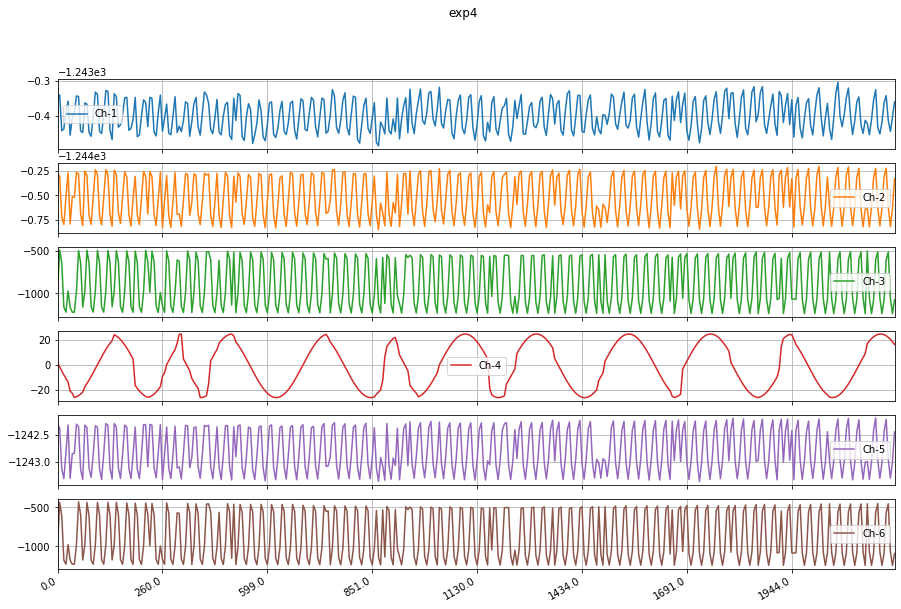

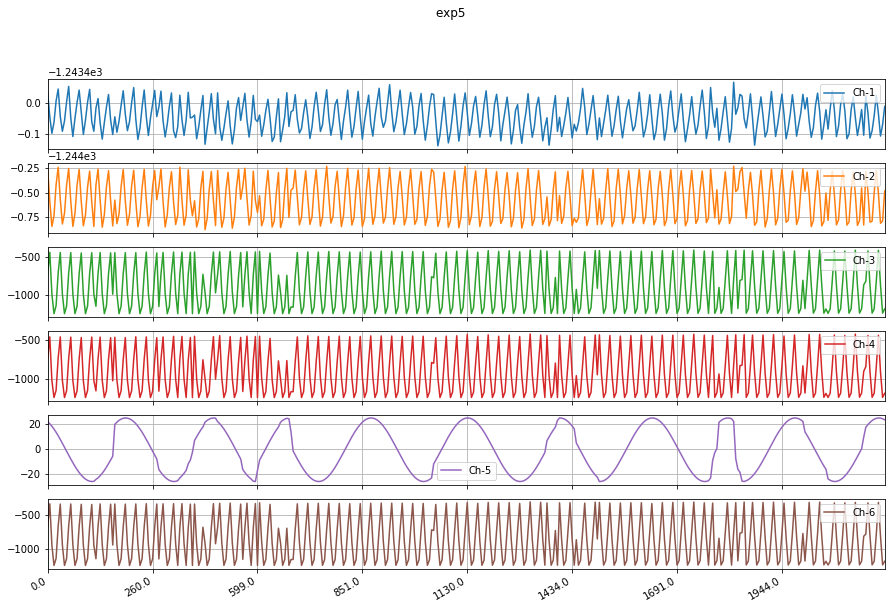

...

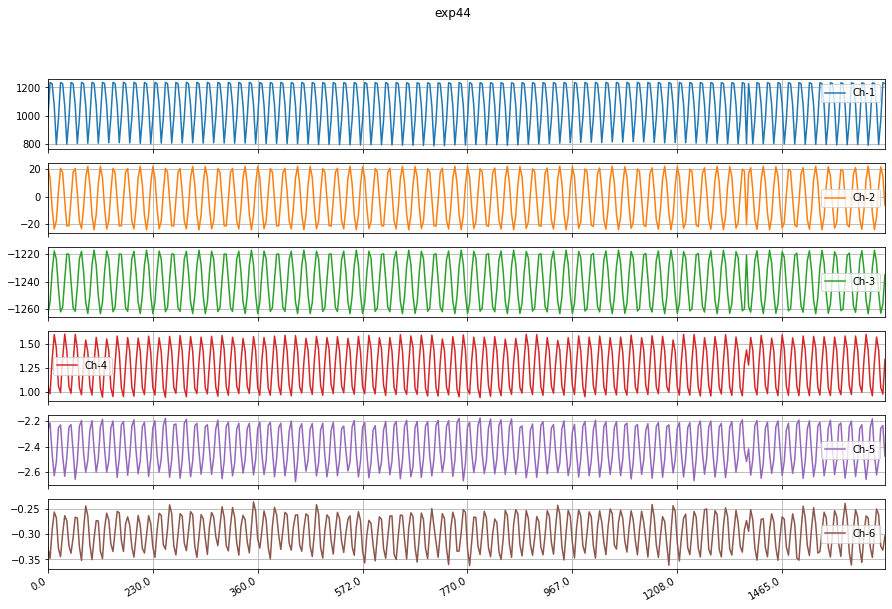

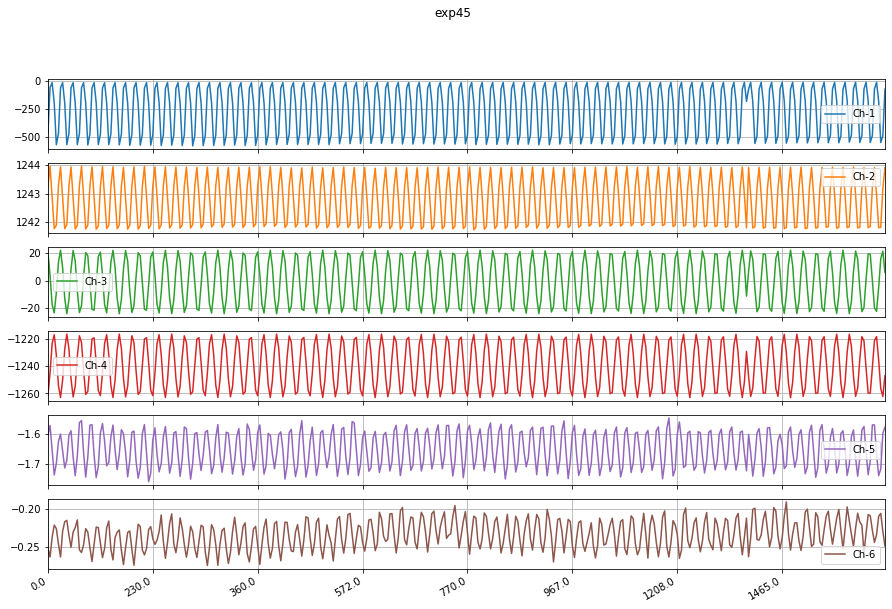

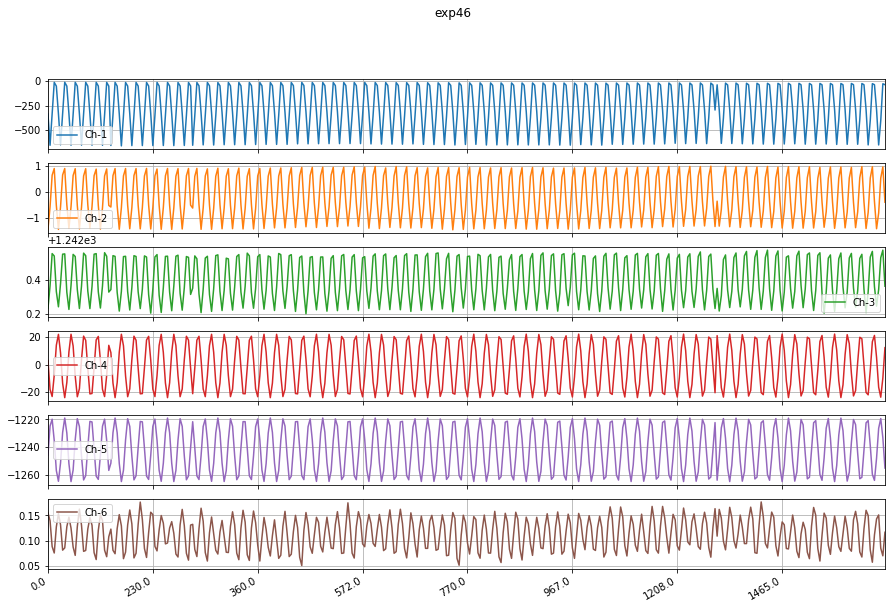

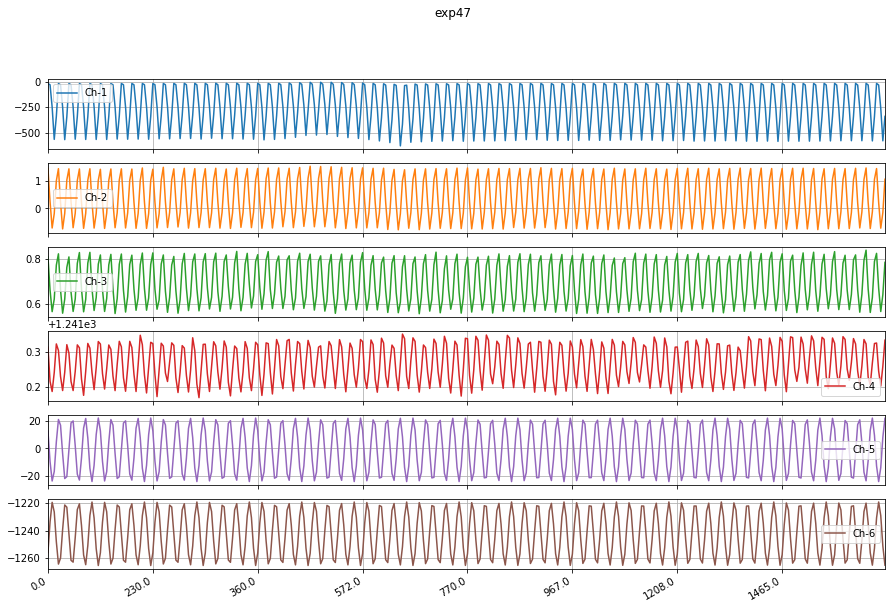

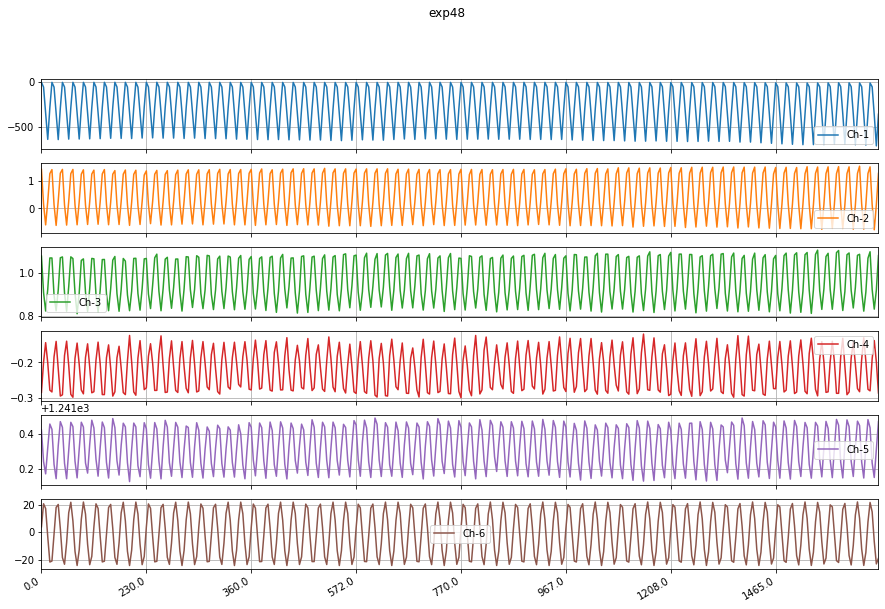

In [23]:
for individual in all_csv:
    df = tidyTSAppOutput(pd.read_csv(individual))
    #print(df)
    experiment_name = individual[20:-4]
    #print(experiment_name)
    plot_trace(df, ["Ch-1","Ch-2","Ch-3","Ch-4","Ch-5","Ch-6"], title = experiment_name, save= True, saveas = experiment_name)